In [1]:
import os,sys,time
from mido import MidiFile
import matplotlib.pyplot as plt
import numpy as np

from scipy.io import wavfile
from IPython.display import Audio

import musiclib

pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


In [25]:
# Find the sepration point between Fugue and Prelude
def printSeparationPoint(filename):
    notes_onsets_offsets_correct = musiclib.load_midi(filename)
    onsets = []
    for i, e in list(enumerate(notes_onsets_offsets_correct)):
        onsets.append(e[1])
    max_diff = 0
    max_diff_index_1 = 0
    max_diff_index_2 = 0
    distinct_onsets = sorted(list(set(onsets)))
    for i, onset in enumerate(distinct_onsets):
        if (i + 1) <  len(distinct_onsets):
            diff = distinct_onsets[i + 1] - distinct_onsets[i]
            if diff > max_diff:
                max_diff = diff
                max_diff_index_1 = i
                max_diff_index_2 = i + 1

    #print("maximum difference between onsets :", max_diff)
    #print("index_last_prelude_note", max_diff_index_1)
    #print("index_first_fugue_note", max_diff_index_2)
    #print("time_last_prelude_note", distinct_onsets[max_diff_index_1], "sec")
    #print("time_first_fugue_note", distinct_onsets[max_diff_index_2], "sec")

    midi = MidiFile(filename)
    print(midi.length)
    prelude_ending = (distinct_onsets[max_diff_index_1] + distinct_onsets[max_diff_index_2])/2
    # If the separation point between fugue and prelude is not at least 10 seconds from and beginning
    # and 10 seconds from the end of the song, we have a problem.
    if ((prelude_ending > 10) and (prelude_ending < midi.length - 10)):
        print("Separation point is at", prelude_ending, "sec")
    else:
        print("There is something weird about this piece. Please check whether either the fugue or prelude is absent.")

In [27]:
i = 0
for filename in os.listdir('bach_wtc'):
    if filename[-4:] != '.mid': continue
    print('========== {} =========='.format(i))
    print(filename)
    i += 1
    if filename == '082_bwv857.mid': # just the prelude
        print('Special case')
        continue
    if filename == '083_bwv857.mid': # just the fugue
        print('Special case')
        continue
    if filename == '103_bwv885.mid': # incomplete
        print('Special case')
        continue
    if filename == '051_bwv874.mid': # just the fugue
        print('Special case')
        continue
        
    printSeparationPoint('bach_wtc/{}'.format(filename))
    #bwv = int(filename[7:10])
    #print(filename,end=' ')
    #if bwv < 870: 
    #    book = 1
    #    number = bwv - 846
    #else: 
    #    book = 2
    #    number = bwv - 870
    
    #print('wtc{}{}'.format(book,str(number).zfill(2)))
    

========== 0 ==========
083_bwv857.mid
Special case
========== 1 ==========
101_bwv885.mid
length of midi file303.6458333333331
303.6458333333331
Separation point is at 146.5677083333332 sec
========== 2 ==========
074_bwv853.mid
length of midi file525.7291666666489
525.7291666666489
Separation point is at 217.43541666666852 sec
========== 3 ==========
003_bwv865.mid
length of midi file316.22786458333104
316.22786458333104
Separation point is at 60.066406250000085 sec
========== 4 ==========
076_bwv856.mid
length of midi file128.47499999999962
128.47499999999962
Separation point is at 58.49375000000009 sec
========== 5 ==========
089_bwv883.mid
length of midi file401.0585937499997
401.0585937499997
Separation point is at 197.23502604166742 sec
========== 6 ==========
001_bwv864.mid
length of midi file212.3843750000017
212.3843750000017
Separation point is at 64.94375000000012 sec
========== 7 ==========
069_bwv876.mid
length of midi file227.24739583333428
227.24739583333428
Separation 

Separation point is at 130.08854166666634 sec
========== 59 ==========
073_bwv853.mid
length of midi file514.9062499999895
514.9062499999895
Separation point is at 222.42864583333483 sec
========== 60 ==========
099_bwv884.mid
length of midi file137.27291666666648
137.27291666666648
Separation point is at 70.55781249999998 sec
========== 61 ==========
059_bwv848.mid
length of midi file230.99375000000126
230.99375000000126
Separation point is at 81.51770833333279 sec
========== 62 ==========
097_bwv860.mid
length of midi file222.8450520833338
222.8450520833338
Separation point is at 51.23177083333329 sec
========== 63 ==========
096_bwv860.mid
length of midi file200.47187500000223
200.47187500000223
Separation point is at 48.952604166666646 sec
========== 64 ==========
006_bwv889.mid
length of midi file241.37890625000088
241.37890625000088
Separation point is at 148.38867187499957 sec
========== 65 ==========
046_bwv850.mid
length of midi file175.88541666666745
175.88541666666745
Separa

# look at an individual midi

In [21]:
basename = '051_bwv874'

In [22]:
fs = 44100
stride = 512

# Find the correct onsets from the maestro midi file wtc1p19.mid
notes_onsets_offsets_correct = musiclib.load_midi('bach_wtc/{}.mid'.format(basename))

length = 0
for i, e in list(enumerate(notes_onsets_offsets_correct)):
    notes_onsets_offsets_correct[i] = (e[0], (e[1]*fs)/stride, (e[2]*fs)/stride)
    length = int(max(length,(e[2]*fs)))

x = np.zeros((length, 128), dtype=bool)

# Discretize maestro 
for note, onset, offset in notes_onsets_offsets_correct:
    onset = int(onset*stride)
    offset = int(offset*stride)
    for i in range(onset, offset):
        if (onset > x.shape[0] or offset > x.shape[0]):
            print("onset : " + str(onset) + " offset " + str(offset))
            break
        else:
            x[i][int(note)] = True  

length of midi file171.83203125000045


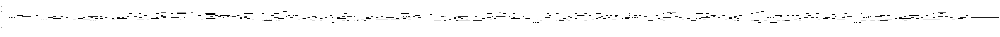

In [23]:
plt.figure(figsize=(200,20))
plt.imshow(np.transpose(x[::512]), interpolation='none', cmap='Greys', aspect=4)

In [24]:
fs, audio = wavfile.read('bach_wtc/{}.wav'.format(basename))
Audio(audio[:,0],rate=fs)                